In [8]:
# !pip install pandas
# !pip install plotly

In [15]:
!pip install matplotlib seaborn


     ---------------------------------------- 0.0/162.6 kB ? eta -:--:--
     ------- ------------------------------- 30.7/162.6 kB 1.4 MB/s eta 0:00:01
     ----------------------------------- -- 153.6/162.6 kB 1.8 MB/s eta 0:00:01
     -------------------------------------- 162.6/162.6 kB 2.0 MB/s eta 0:00:00
   ---------------------------------------- 0.0/7.6 MB ? eta -:--:--
   - -------------------------------------- 0.2/7.6 MB 6.3 MB/s eta 0:00:02
   --- ------------------------------------ 0.7/7.6 MB 7.3 MB/s eta 0:00:01
   ------- -------------------------------- 1.4/7.6 MB 10.2 MB/s eta 0:00:01
   ------------- -------------------------- 2.6/7.6 MB 13.7 MB/s eta 0:00:01
   ---------------- ----------------------- 3.1/7.6 MB 16.5 MB/s eta 0:00:01
   ----------------------- ---------------- 4.5/7.6 MB 18.0 MB/s eta 0:00:01
   ------------------------ --------------- 4.6/7.6 MB 16.3 MB/s eta 0:00:01
   ---------------------------------- ----- 6.6/7.6 MB 17.5 MB/s eta 0:00:01
   -

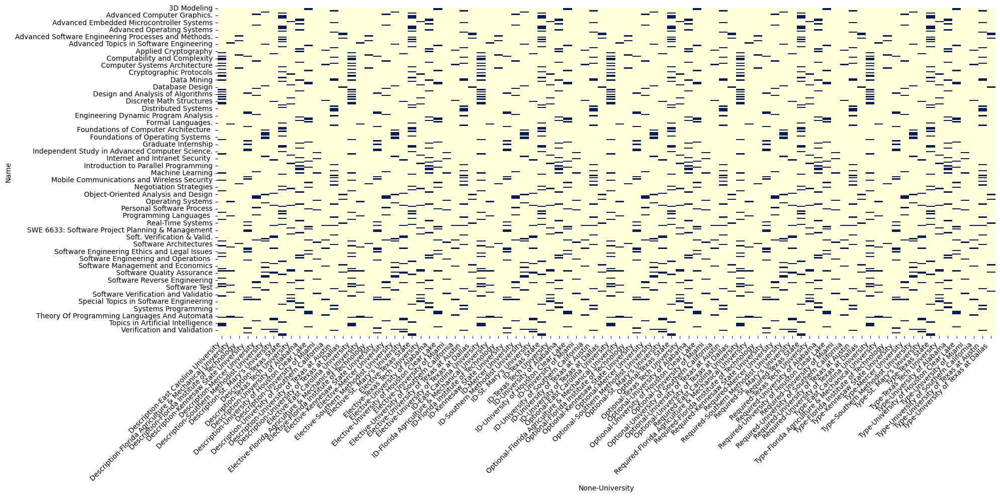

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

courses_data = pd.read_excel(file_path, sheet_name='Courses')

# Assuming 'courses_data' is your DataFrame
# Preparing the data (repeat the pivot table step as necessary)
course_university_matrix = pd.pivot_table(courses_data, index='Name', columns='University', aggfunc=len, fill_value=0)
course_university_matrix = (course_university_matrix > 0).astype(int)

# Create the heatmap using seaborn
plt.figure(figsize=(20, 10))  # Adjust the figure size as necessary to accommodate your data
sns.heatmap(course_university_matrix, annot=False, cmap="YlGnBu", cbar=False)

# Improve readability
plt.xticks(rotation=45, ha="right")  # Rotate the x-axis labels for better readability
plt.yticks(rotation=0)
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels

# Save the figure as a PDF
plt.savefig("course_university_matrix.pdf", format='pdf')

# Display the plot
plt.show()


In [9]:
import pandas as pd
import plotly.express as px

# Replace 'National SWE Courses.xlsx' with your file's name
file_path = 'data/courses_data.xlsx'
courses_data = pd.read_excel(file_path, sheet_name='Courses')

# Display the first few rows of the DataFrame
courses_data.head()


# Assuming 'courses_data' is your DataFrame containing the courses information
courses_count_by_university = courses_data['University'].value_counts().reset_index()
courses_count_by_university.columns = ['University', 'Number of Courses']

fig = px.bar(courses_count_by_university, x='University', y='Number of Courses',
             title='Distribution of SWE Courses by University',
             labels={'Number of Courses': 'Number of Courses', 'University': 'University'},
             color='Number of Courses', color_continuous_scale=px.colors.sequential.Viridis)

fig.show()


In [10]:
import plotly.express as px
import pandas as pd
# Ensure you have kaleido installed for image export
from plotly.io import write_image

# Load your data into a DataFrame
courses_data = pd.read_excel('data/courses_data.xlsx', sheet_name='Courses')

# Assuming 'courses_data' contains your courses information
courses_count_by_university = courses_data['University'].value_counts().reset_index()
courses_count_by_university.columns = ['University', 'Number of Courses']

# Create the figure with Plotly
fig = px.bar(courses_count_by_university, x='University', y='Number of Courses',
             title='Distribution of SWE Courses by University',
             labels={'Number of Courses': 'Number of Courses', 'University': 'University'},
             color='Number of Courses', color_continuous_scale=px.colors.sequential.Viridis)



# Save the figure as a PNG image
fig.write_image("output/swe/courses_distribution.png")


In [11]:
import plotly.express as px
import pandas as pd
from plotly.io import write_image

# Assuming 'courses_data' is your DataFrame containing the courses information
course_name_counts = courses_data['Name'].value_counts().reset_index().head(10)
course_name_counts.columns = ['Course Name', 'Frequency']

# Create the figure with Plotly
fig = px.bar(course_name_counts, x='Course Name', y='Frequency',
             title='Top 10 Most Frequently Offered SWE Courses',
             labels={'Frequency': 'Frequency', 'Course Name': 'Course Name'},
             color='Frequency', color_continuous_scale=px.colors.sequential.Viridis)


# Save the figure as a PNG image
fig.write_image("output/swe/top_courses_distribution.png")


In [12]:
import plotly.express as px
import pandas as pd
from plotly.io import write_image

# Assuming 'courses_data' is your DataFrame
course_name_counts = courses_data['Name'].value_counts().reset_index().head(20)  # Adjusted to show top 20
course_name_counts.columns = ['Course Name', 'Frequency']

# Create the figure with Plotly
fig = px.bar(course_name_counts, x='Course Name', y='Frequency',
             title='Top 20 Most Frequently Offered SWE Courses',
             labels={'Frequency': 'Frequency', 'Course Name': 'Course Name'},
             color='Frequency', color_continuous_scale=px.colors.sequential.Viridis)


# Save the figure as a PNG image
fig.write_image("output/swe/top_20_courses_distribution.png")


In [13]:
import pandas as pd

# Load your data into a DataFrame
courses_data = pd.read_excel('data/courses_data.xlsx', sheet_name='Courses')

# Assuming 'courses_data' is your DataFrame
# Create a binary matrix indicating the presence of courses at each university
course_university_matrix = pd.pivot_table(courses_data, index='Name', columns='University', aggfunc=len, fill_value=0)

# Convert the presence of courses from count to binary (1 for present, 0 for absent)
# This line replaces the use of applymap with a simple comparison operation, which is vectorized and efficient.
course_university_matrix = (course_university_matrix > 0).astype(int)


In [14]:
import plotly.figure_factory as ff

# Generate the heatmap
fig = ff.create_annotated_heatmap(z=course_university_matrix.values,
                                  x=course_university_matrix.columns.tolist(),
                                  y=course_university_matrix.index.tolist(),
                                  colorscale='Viridis',
                                  showscale=True)

# Update layout to make it more readable
fig.update_layout(title='Course Offerings by University',
                  xaxis=dict(title='University'),
                  yaxis=dict(title='Courses'),
                  margin=dict(l=150, r=50, t=50, b=100))

# Rotate the x-axis labels for better readability
fig.update_xaxes(tickangle=45)


# Save the figure as a PNG image (ensure kaleido is installed)
fig.write_image("output/swe/course_offerings_matrix.png")


In [1]:
import pandas as pd
import plotly.figure_factory as ff

# Load the courses data from the Excel file
file_path = 'data/courses_data.xlsx'
courses_data = pd.read_excel(file_path, sheet_name='Courses')

# Filter courses offered by ECU
ecu_courses = courses_data[courses_data['University'] == 'East Carolina University']

# Identify similar courses from other universities (matching by course 'Name')
similar_courses = courses_data[courses_data['Name'].isin(ecu_courses['Name']) & (courses_data['University'] != 'East Carolina University')]

# Combine ECU courses with similar courses from other universities
combined_courses = pd.concat([ecu_courses, similar_courses])

# Create a pivot table for the heatmap, where the rows are course names and the columns are universities
course_university_matrix = combined_courses.pivot_table(index='Name', columns='University', aggfunc='size', fill_value=0)

# Generate the heatmap
fig = ff.create_annotated_heatmap(z=course_university_matrix.values,
                                  x=course_university_matrix.columns.tolist(),
                                  y=course_university_matrix.index.tolist(),
                                  colorscale='Viridis',
                                  showscale=True)

# Update layout to make it more readable
fig.update_layout(title='Comparison of ECU Courses with Similar Courses from Other Universities',
                  xaxis=dict(title='University'),
                  yaxis=dict(title='Courses'),
                  margin=dict(l=150, r=50, t=50, b=100))

# Rotate the x-axis labels for better readability
fig.update_xaxes(tickangle=45)

fig.show()


In [2]:
import plotly.figure_factory as ff

# Generate the heatmap with improved readability
fig = ff.create_annotated_heatmap(z=course_university_matrix.values,
                                  x=course_university_matrix.columns.tolist(),
                                  y=course_university_matrix.index.tolist(),
                                  colorscale='Viridis',
                                  showscale=True,
                                  font_colors=['white', 'black'])

# Increase figure size for better readability
fig.update_layout(
    title='Comparison of ECU Courses with Similar Courses from Other Universities',
    xaxis=dict(title='University'),
    yaxis=dict(title='Courses'),
    margin=dict(l=200, r=50, t=50, b=150),  # adjust the left margin to accommodate course names
    autosize=False,
    width=1200,   # You can adjust this width according to your screen or display requirements
    height=800    # Adjust the height based on the number of courses
)

# Improve text angle and font size for y-axis labels to minimize overlap
fig.update_yaxes(tickangle=-45, tickfont=dict(size=10))

# Enable hover information for better interactivity
fig.update_traces(hoverinfo='text', hovertemplate='Course: %{y}<br>University: %{x}')

fig.show()


In [ ]:
# In the heatmap, the numbers 0, 1, and 2 are counts of how many times each course appears across the universities listed. Here's what they likely represent:
# 
#     0: The course is not offered by the university in that column.
#     1: The course is offered by the university in that column.
#     2 (or higher): The course is listed more than once for the university in that column, which could indicate that the course has multiple entries in the dataset, possibly due to different course sections, semesters, or an error in data entry.